In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

%matplotlib inline

D:\ProgrammeFile\Anaconda\lib\site-packages\sklearn\externals\six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


### Option 1: sliding window

In [2]:
SlidingOne = pd.read_csv('../data/sliding01.csv', sep=',', index_col=0)
SlidingOne.head()

,result,odds-home,odds-draw,odds-away,home-wins,home-draws,home-losses,home-goals,home-opposition-goals,away-wins,away-draws,away-losses,away-goals,away-opposition-goals
0,H,1.36,4.50,9.00,5,3,2,14,10,2,2,6,8,14
1,D,2.25,3.00,3.50,3,4,3,16,12,4,3,3,14,12
2,D,2.80,3.00,2.70,5,2,3,10,8,4,4,2,15,13
3,A,1.91,3.25,4.33,5,3,2,18,11,3,3,4,10,11
4,H,2.10,3.00,4.00,2,4,4,6,9,1,6,3,7,10


In [3]:
# instantiate labelencoder object
le = LabelEncoder()

# apply le on categorical feature columns
categorical_cols = ['result']
SlidingOne.loc[:, categorical_cols] = SlidingOne[categorical_cols].apply(lambda col: le.fit_transform(col))

SlidingOne.head()

,result,odds-home,odds-draw,odds-away,home-wins,home-draws,home-losses,home-goals,home-opposition-goals,away-wins,away-draws,away-losses,away-goals,away-opposition-goals
0,2,1.36,4.50,9.00,5,3,2,14,10,2,2,6,8,14
1,1,2.25,3.00,3.50,3,4,3,16,12,4,3,3,14,12
2,1,2.80,3.00,2.70,5,2,3,10,8,4,4,2,15,13
3,0,1.91,3.25,4.33,5,3,2,18,11,3,3,4,10,11
4,2,2.10,3.00,4.00,2,4,4,6,9,1,6,3,7,10


In [4]:
y= SlidingOne['result']

dfX = SlidingOne.loc[:, SlidingOne.columns != 'result']
X = dfX.to_numpy()

In [5]:
X_train, X_test, y_train, y_test = train_test_split(
         X, y, test_size=0.3, random_state=0,shuffle=False)

In [6]:
tree = DecisionTreeClassifier(criterion='gini', max_depth=15, random_state=0)
tree.fit(X_train, y_train)

y_pred = tree.predict(X_test)
print('Misclassified samples: %d' % (y_test != y_pred).sum())

Misclassified samples: 3382


In [7]:
print('The accuracy is : %.2f' % tree.score(X, y))

The accuracy is : 0.64


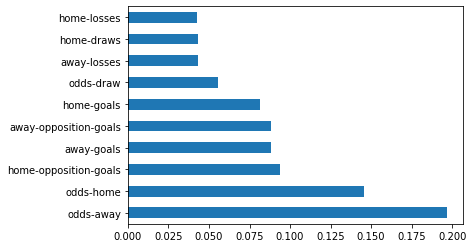

In [8]:

feat_importances = pd.Series(tree.feature_importances_, index=dfX.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

#### 6. Visualize the resulting tree

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.211695 to fit



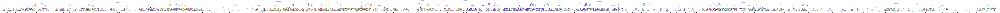

In [9]:
dot_data = StringIO()
export_graphviz(tree, 
                out_file=dot_data,
                feature_names=dfX.columns,
                filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())


### Option 2

In [10]:
SlidingTwo = pd.read_csv('../data/sliding02_shots.csv', sep=',', index_col=0)
SlidingTwo.head()

,result,odds-home,odds-draw,odds-away,home-wins,home-draws,home-losses,home-goals,home-opposition-goals,home-shots,...,home-opposition_shots_on_target,away-wins,away-draws,away-losses,away-goals,away-opposition-goals,away-shots,away-shots_on_target,away-opposition_shots,away-opposition_shots_on_target
0,H,3.50,3.30,2.10,1,3,6,11,16,137,...,53,8,2,0,15,6,161,78,72,30
1,D,2.50,3.30,2.88,3,1,6,8,16,134,...,77,3,3,4,11,18,104,44,87,36
2,A,1.91,3.40,4.20,4,2,4,10,15,120,...,56,2,2,6,11,15,134,59,100,46
3,H,3.25,3.25,2.30,5,2,3,22,12,177,...,37,6,3,1,19,8,169,95,113,58
4,H,1.20,6.00,19.00,7,2,1,15,8,161,...,31,3,2,5,10,17,143,69,134,69


In [11]:
# instantiate labelencoder object
le = LabelEncoder()

# apply le on categorical feature columns
categorical_cols = ['result']
SlidingTwo.loc[:, categorical_cols] = SlidingTwo[categorical_cols].apply(lambda col: le.fit_transform(col))

SlidingTwo.head()

,result,odds-home,odds-draw,odds-away,home-wins,home-draws,home-losses,home-goals,home-opposition-goals,home-shots,...,home-opposition_shots_on_target,away-wins,away-draws,away-losses,away-goals,away-opposition-goals,away-shots,away-shots_on_target,away-opposition_shots,away-opposition_shots_on_target
0,2,3.50,3.30,2.10,1,3,6,11,16,137,...,53,8,2,0,15,6,161,78,72,30
1,1,2.50,3.30,2.88,3,1,6,8,16,134,...,77,3,3,4,11,18,104,44,87,36
2,0,1.91,3.40,4.20,4,2,4,10,15,120,...,56,2,2,6,11,15,134,59,100,46
3,2,3.25,3.25,2.30,5,2,3,22,12,177,...,37,6,3,1,19,8,169,95,113,58
4,2,1.20,6.00,19.00,7,2,1,15,8,161,...,31,3,2,5,10,17,143,69,134,69


In [12]:
y= SlidingTwo['result']

dfX = SlidingTwo.loc[:, SlidingTwo.columns != 'result']
X = dfX.to_numpy()

In [13]:
X_train, X_test, y_train, y_test = train_test_split(
         X, y, test_size=0.3, random_state=0,shuffle=False)

In [14]:
tree = DecisionTreeClassifier(criterion='gini', max_depth=15, random_state=0)
tree.fit(X_train, y_train)

y_pred = tree.predict(X_test)
print('Misclassified samples: %d' % (y_test != y_pred).sum())

Misclassified samples: 1236


In [15]:
print('The accuracy is : %.2f' % tree.score(X, y))

The accuracy is : 0.72


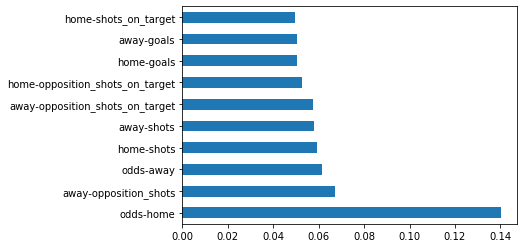

In [16]:

feat_importances = pd.Series(tree.feature_importances_, index=dfX.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

#### 6. Visualize the resulting tree

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.487844 to fit



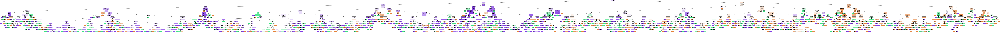

In [17]:
dot_data = StringIO()
export_graphviz(tree, 
                out_file=dot_data,
                feature_names=dfX.columns,
                filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())


### Option 3

In [18]:
SlidingThree = pd.read_csv('../data/sliding03_shots_extra.csv', sep=',', index_col=0)
SlidingThree.head()

,result,odds-home,odds-draw,odds-away,home-wins,home-draws,home-losses,home-goals,home-opposition-goals,home-shots,...,away-opposition_shots,away-opposition_shots_on_target,home_shot_accuracy,home_shot_efficiency,home_opposition_shot_accuracy,home_opposition_shot_efficiency,away_shot_accuracy,away_shot_efficiency,away_opposition_shot_accuracy,away_opposition_shot_efficiency
0,H,3.50,3.30,2.10,1,3,6,11,16,137,...,72,30,0.489051,0.164179,0.452991,0.301887,0.484472,0.192308,0.416667,0.200000
1,D,2.50,3.30,2.88,3,1,6,8,16,134,...,87,36,0.477612,0.125000,0.509934,0.207792,0.423077,0.250000,0.413793,0.500000
2,A,1.91,3.40,4.20,4,2,4,10,15,120,...,100,46,0.483333,0.172414,0.451613,0.267857,0.440299,0.186441,0.460000,0.326087
3,H,3.25,3.25,2.30,5,2,3,22,12,177,...,113,58,0.463277,0.268293,0.500000,0.324324,0.562130,0.200000,0.513274,0.137931
4,H,1.20,6.00,19.00,7,2,1,15,8,161,...,134,69,0.447205,0.208333,0.418919,0.258065,0.482517,0.144928,0.514925,0.246377


In [19]:
# instantiate labelencoder object
le = LabelEncoder()

# apply le on categorical feature columns
categorical_cols = ['result']
SlidingThree.loc[:, categorical_cols] = SlidingThree[categorical_cols].apply(lambda col: le.fit_transform(col))

SlidingThree.head()

,result,odds-home,odds-draw,odds-away,home-wins,home-draws,home-losses,home-goals,home-opposition-goals,home-shots,...,away-opposition_shots,away-opposition_shots_on_target,home_shot_accuracy,home_shot_efficiency,home_opposition_shot_accuracy,home_opposition_shot_efficiency,away_shot_accuracy,away_shot_efficiency,away_opposition_shot_accuracy,away_opposition_shot_efficiency
0,2,3.50,3.30,2.10,1,3,6,11,16,137,...,72,30,0.489051,0.164179,0.452991,0.301887,0.484472,0.192308,0.416667,0.200000
1,1,2.50,3.30,2.88,3,1,6,8,16,134,...,87,36,0.477612,0.125000,0.509934,0.207792,0.423077,0.250000,0.413793,0.500000
2,0,1.91,3.40,4.20,4,2,4,10,15,120,...,100,46,0.483333,0.172414,0.451613,0.267857,0.440299,0.186441,0.460000,0.326087
3,2,3.25,3.25,2.30,5,2,3,22,12,177,...,113,58,0.463277,0.268293,0.500000,0.324324,0.562130,0.200000,0.513274,0.137931
4,2,1.20,6.00,19.00,7,2,1,15,8,161,...,134,69,0.447205,0.208333,0.418919,0.258065,0.482517,0.144928,0.514925,0.246377


In [20]:
y= SlidingThree['result']

dfX = SlidingThree.loc[:, SlidingThree.columns != 'result']
X = dfX.to_numpy()

In [21]:
X_train, X_test, y_train, y_test = train_test_split(
         X, y, test_size=0.3, random_state=0,shuffle=False)

In [22]:
tree = DecisionTreeClassifier(criterion='gini', max_depth=15, random_state=0)
tree.fit(X_train, y_train)

y_pred = tree.predict(X_test)
print('Misclassified samples: %d' % (y_test != y_pred).sum())

Misclassified samples: 1225


In [23]:
print('The accuracy is : %.2f' % tree.score(X, y))

The accuracy is : 0.73


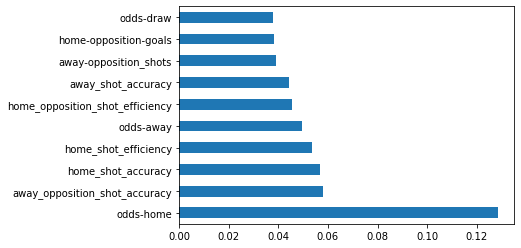

In [24]:

feat_importances = pd.Series(tree.feature_importances_, index=dfX.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

#### 6. Visualize the resulting tree

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.506845 to fit



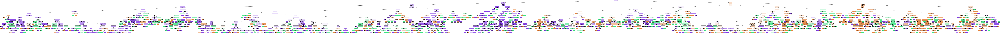

In [25]:
dot_data = StringIO()
export_graphviz(tree, 
                out_file=dot_data,
                feature_names=dfX.columns,
                filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())


### Option 4

In [26]:
SlidingFour = pd.read_csv('../data/sliding04_shots_and_possession.csv', sep=',', index_col=0)
SlidingFour.head()

,result,odds-home,odds-draw,odds-away,home-wins,home-draws,home-losses,home-goals,home-opposition-goals,home-shots,...,away-draws,away-losses,away-goals,away-opposition-goals,away-shots,away-shots_on_target,away-possession,away-opposition_shots,away-opposition_shots_on_target,away-opposition_possession
0,H,3.50,3.30,2.1,1,3,6,11,16,137,...,2,0,15,6,161,78,482,72,30,428
1,H,3.25,3.25,2.3,5,2,3,19,12,189,...,3,1,19,8,169,95,548,113,58,362
2,H,1.20,6.00,19.0,7,2,1,15,8,161,...,2,6,9,18,132,62,424,139,71,486
3,A,2.38,3.30,3.0,3,3,4,9,11,102,...,2,5,9,16,116,54,410,131,64,500
4,A,2.60,3.25,2.8,4,1,5,15,16,125,...,3,3,13,16,103,51,437,138,76,473


In [27]:
# instantiate labelencoder object
le = LabelEncoder()

# apply le on categorical feature columns
categorical_cols = ['result']
SlidingFour.loc[:, categorical_cols] = SlidingFour[categorical_cols].apply(lambda col: le.fit_transform(col))

SlidingFour.head()

,result,odds-home,odds-draw,odds-away,home-wins,home-draws,home-losses,home-goals,home-opposition-goals,home-shots,...,away-draws,away-losses,away-goals,away-opposition-goals,away-shots,away-shots_on_target,away-possession,away-opposition_shots,away-opposition_shots_on_target,away-opposition_possession
0,2,3.50,3.30,2.1,1,3,6,11,16,137,...,2,0,15,6,161,78,482,72,30,428
1,2,3.25,3.25,2.3,5,2,3,19,12,189,...,3,1,19,8,169,95,548,113,58,362
2,2,1.20,6.00,19.0,7,2,1,15,8,161,...,2,6,9,18,132,62,424,139,71,486
3,0,2.38,3.30,3.0,3,3,4,9,11,102,...,2,5,9,16,116,54,410,131,64,500
4,0,2.60,3.25,2.8,4,1,5,15,16,125,...,3,3,13,16,103,51,437,138,76,473


In [28]:
y= SlidingFour['result']

dfX = SlidingFour.loc[:, SlidingFour.columns != 'result']
X = dfX.to_numpy()

In [29]:
X_train, X_test, y_train, y_test = train_test_split(
         X, y, test_size=0.3, random_state=0,shuffle=False)

In [30]:
tree = DecisionTreeClassifier(criterion='gini', max_depth=15, random_state=0)
tree.fit(X_train, y_train)

y_pred = tree.predict(X_test)
print('Misclassified samples: %d' % (y_test != y_pred).sum())

Misclassified samples: 1170


In [31]:
print('The accuracy is : %.2f' % tree.score(X, y))

The accuracy is : 0.73


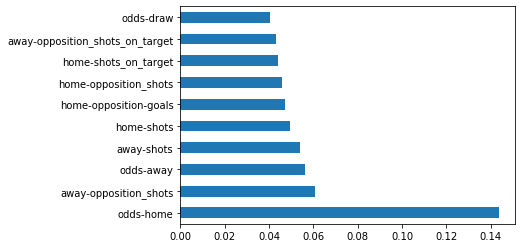

In [32]:

feat_importances = pd.Series(tree.feature_importances_, index=dfX.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

#### 6. Visualize the resulting tree

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.540246 to fit



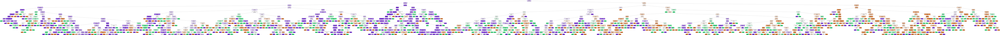

In [33]:
dot_data = StringIO()
export_graphviz(tree, 
                out_file=dot_data,
                feature_names=dfX.columns,
                filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())


### Option 5

In [34]:
SlidingFive = pd.read_csv('../data/sliding05_shots_and_possession_extra.csv', sep=',', index_col=0)
SlidingFive.head()

,result,odds-home,odds-draw,odds-away,home-wins,home-draws,home-losses,home-goals,home-opposition-goals,home-shots,...,away-opposition_shots_on_target,away-opposition_possession,home_shot_accuracy,home_shot_efficiency,home_opposition_shot_accuracy,home_opposition_shot_efficiency,away_shot_accuracy,away_shot_efficiency,away_opposition_shot_accuracy,away_opposition_shot_efficiency
0,H,3.50,3.30,2.1,1,3,6,11,16,137,...,30,428,0.489051,0.164179,0.452991,0.301887,0.484472,0.192308,0.416667,0.200000
1,H,3.25,3.25,2.3,5,2,3,19,12,189,...,58,362,0.470899,0.213483,0.521739,0.333333,0.562130,0.200000,0.513274,0.137931
2,H,1.20,6.00,19.0,7,2,1,15,8,161,...,71,486,0.447205,0.208333,0.418919,0.258065,0.469697,0.145161,0.510791,0.253521
3,A,2.38,3.30,3.0,3,3,4,9,11,102,...,64,500,0.460784,0.191489,0.578947,0.142857,0.465517,0.166667,0.488550,0.250000
4,A,2.60,3.25,2.8,4,1,5,15,16,125,...,76,473,0.504000,0.238095,0.477124,0.219178,0.495146,0.254902,0.550725,0.210526


In [35]:
# instantiate labelencoder object
le = LabelEncoder()

# apply le on categorical feature columns
categorical_cols = ['result']
SlidingFive.loc[:, categorical_cols] = SlidingFive[categorical_cols].apply(lambda col: le.fit_transform(col))

SlidingFive.head()

,result,odds-home,odds-draw,odds-away,home-wins,home-draws,home-losses,home-goals,home-opposition-goals,home-shots,...,away-opposition_shots_on_target,away-opposition_possession,home_shot_accuracy,home_shot_efficiency,home_opposition_shot_accuracy,home_opposition_shot_efficiency,away_shot_accuracy,away_shot_efficiency,away_opposition_shot_accuracy,away_opposition_shot_efficiency
0,2,3.50,3.30,2.1,1,3,6,11,16,137,...,30,428,0.489051,0.164179,0.452991,0.301887,0.484472,0.192308,0.416667,0.200000
1,2,3.25,3.25,2.3,5,2,3,19,12,189,...,58,362,0.470899,0.213483,0.521739,0.333333,0.562130,0.200000,0.513274,0.137931
2,2,1.20,6.00,19.0,7,2,1,15,8,161,...,71,486,0.447205,0.208333,0.418919,0.258065,0.469697,0.145161,0.510791,0.253521
3,0,2.38,3.30,3.0,3,3,4,9,11,102,...,64,500,0.460784,0.191489,0.578947,0.142857,0.465517,0.166667,0.488550,0.250000
4,0,2.60,3.25,2.8,4,1,5,15,16,125,...,76,473,0.504000,0.238095,0.477124,0.219178,0.495146,0.254902,0.550725,0.210526


In [36]:
y= SlidingFive['result']

dfX = SlidingFive.loc[:, SlidingFive.columns != 'result']
X = dfX.to_numpy()

In [37]:
X_train, X_test, y_train, y_test = train_test_split(
         X, y, test_size=0.3, random_state=0,shuffle=False)

In [38]:
tree = DecisionTreeClassifier(criterion='gini', max_depth=15, random_state=0)
tree.fit(X_train, y_train)

y_pred = tree.predict(X_test)
print('Misclassified samples: %d' % (y_test != y_pred).sum())

Misclassified samples: 1181


In [39]:
print('The accuracy is : %.2f' % tree.score(X, y))

The accuracy is : 0.75


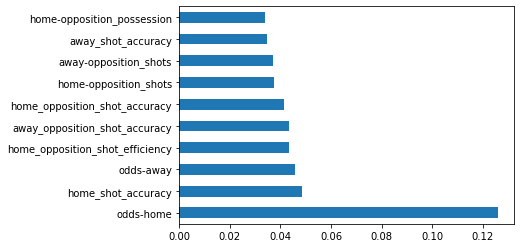

In [40]:

feat_importances = pd.Series(tree.feature_importances_, index=dfX.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

#### 6. Visualize the resulting tree

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.481634 to fit



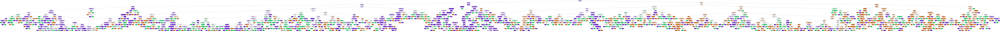

In [41]:
dot_data = StringIO()
export_graphviz(tree, 
                out_file=dot_data,
                feature_names=dfX.columns,
                filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())
